IMPORT LIBRARIES

In [1]:

#mpl.rcParams['figure.dpi'] = 300
from cellpose import utils, io
from cellpose import models
from cellpose import plot

import numpy as np
import time, os, sys
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
import cv2
import matplotlib.pyplot as plt
import numpy as np
import time
from tifffile import imwrite
from PIL import Image
import tkinter as tk
from tkinter import filedialog
import skimage.io
time.sleep(0.5)
from matplotlib.pyplot import figure
import timeit

global MM, MM_ag, AA, AA_ag, time, time_step

SELECT FILE and DISPLAY FIRST IMAGE

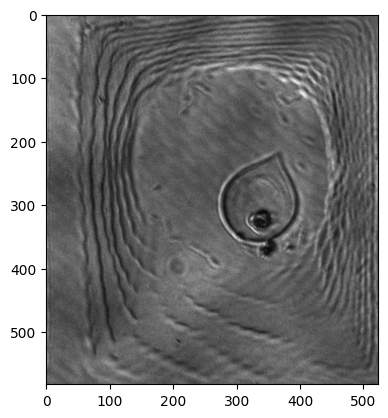

In [29]:
root = tk.Tk()
root.withdraw()

file_path = filedialog.askopenfilename()
stack = skimage.io.imread(file_path)
plt.imshow(stack[0,:,:], cmap='gray')
stack_BF=stack

directory_to_save=os.path.dirname(file_path)
os.chdir(directory_to_save)

TEST CELLPOSE ON A SINGLE IMAGE FOR MEMBRANE SEGMENTATION

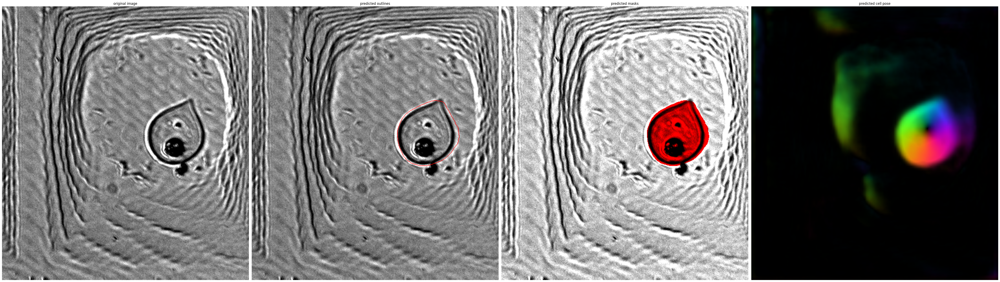

Time:  3.133375800040085


In [30]:
start = timeit.default_timer()
data=2**16-stack_BF[32,:,:];
model = models.Cellpose(gpu=False, model_type='cyto')
channels = [0,0] # IF YOU HAVE GRAYSCALE
masks, flows, styles, diams = model.eval(data, diameter=140, channels=channels)
fig = plt.figure(figsize=(50,20))
plot.show_segmentation(fig, 2**16-data, masks, flows[0], channels=channels)
plt.tight_layout()
plt.show()
stop = timeit.default_timer()
print('Time: ', stop - start)  


EXTRACT DIAMETER SIZE AND AREA

In [31]:
DIAM=utils.diameters(masks)
dd=DIAM[1];
dd=dd[0]*1.59
print('diameter capsule=',dd,'µm')

perimeters = utils.get_mask_perimeters(masks)
npoints = np.unique(masks, return_counts=True)[1][1:]
areas = npoints
Area=areas[0]
print('Area of the capsule = ',Area,'µm^2')

diameter capsule= 187.12077650544316 µm
Area of the capsule =  13850 µm^2


RUN OVER THE LOOP

In [42]:
time_step=10


n=np.shape(stack_BF)
MM=np.zeros([n[0], n[1],n[2]],dtype=np.uint8)
np.sqrt(np.sum(MM))

AA=np.zeros(n[0])
DD=np.zeros(n[0])
MM=np.zeros([n[0], n[1],n[2]])
dd=80
for ii in range(0,n[0],time_step):
    data=2**16-stack_BF[ii,:,:];
    model = models.Cellpose(gpu=False, model_type='cyto')
    channels = [0,0] # IF YOU HAVE GRAYSCALE
    masks, flows, styles, diams = model.eval(data, diameter=120, channels=channels)
    perimeters = utils.get_mask_perimeters(masks)
    npoints = np.unique(masks, return_counts=True)[1][1:]
    areas = npoints
    DIAM=utils.diameters(masks)
    dd=DIAM[1];
    if areas.size==0:
        Area=0
        dd=0
    else:
        Area=areas[0]
        dd=dd[0]
    AA[ii]=Area;    
    DD[ii]=dd*1.59;
    MM[ii,:,:]=masks.astype(np.uint8);

    

Plot diameter D(t)

Text(0, 0.5, 'Diameter (µm)')

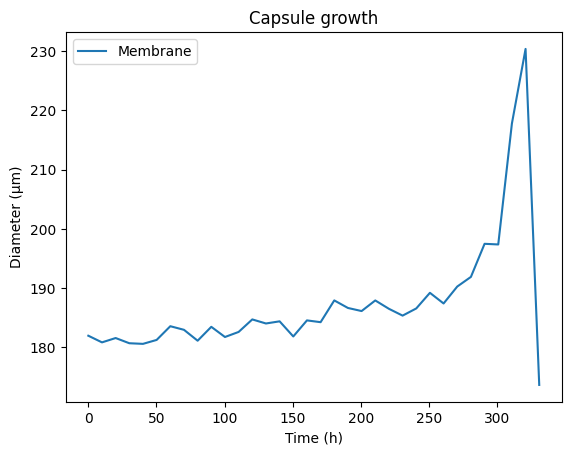

In [43]:
time_vector=np.linspace(0,n[0],n[0])
plt.plot(time_vector[0:n[0]:time_step],DD[0:n[0]:time_step])
plt.title('Capsule growth')
plt.legend(['Membrane'])
plt.xlabel('Time (h)')
plt.ylabel('Diameter (µm)')

ESTIMATE DIAMTER OF THE CELLULAR AGREGATE

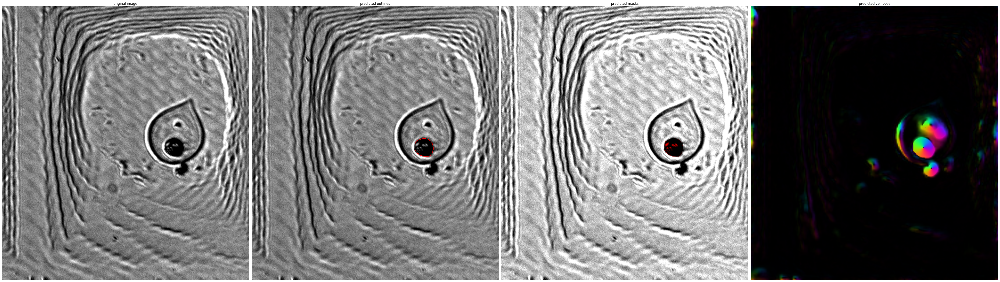

Time:  5.6679419000283815


In [44]:
start = timeit.default_timer()
data=2**16-stack_BF[30,:,:];
model = models.Cellpose(gpu=False, model_type='nuclei')
channels = [0,0] # IF YOU HAVE GRAYSCALE
masks, flows, styles, diams = model.eval(data, diameter=50, channels=channels)
fig = plt.figure(figsize=(50,20))
plot.show_segmentation(fig, 2**16-data, masks, flows[0], channels=channels)
plt.tight_layout()
plt.show()
stop = timeit.default_timer()
print('Time: ', stop - start) 

RUN OVER THE LOOP

In [45]:
n=np.shape(stack_BF)
np.sqrt(np.sum(MM))
MM_ag=np.zeros([n[0], n[1],n[2]],dtype=np.uint8)

AA_ag=np.zeros(n[0])
DD_ag=np.zeros(n[0])

estimation_diameter=np.linspace(40,120,n[0])

for ii in range(0,n[0],time_step):
    data=2**16-stack_BF[ii,:,:];
    model = models.Cellpose(gpu=False, model_type='nuclei')
    channels = [0,0] # IF YOU HAVE GRAYSCALE
    masks, flows, styles, diams = model.eval(data, diameter=60, channels=channels)
    perimeters = utils.get_mask_perimeters(masks)
    npoints = np.unique(masks, return_counts=True)[1][1:]
    areas = npoints
    DIAM=utils.diameters(masks)
    dd=DIAM[1];
    if areas.size==0:
        Area=0
        dd=0
    else:
        Area=np.sum(np.array(areas))
        dd=dd[0]
    AA_ag[ii]=Area; 
    DD_ag[ii]=dd*1.59;
    MM_ag[ii,:,:]=masks.astype(np.uint8)

Plot diameter D(t) for both agregates and wall

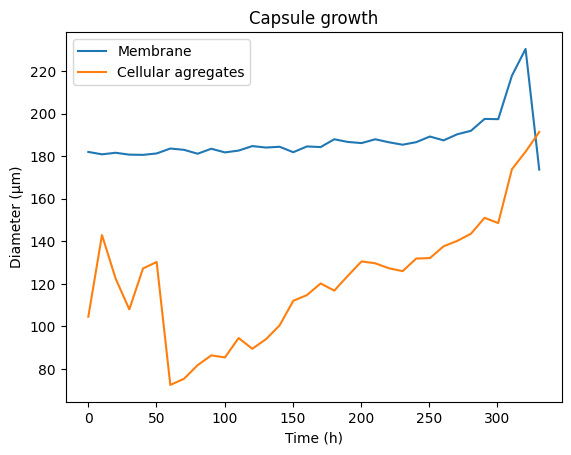

In [46]:
time_vector=np.linspace(0,n[0],n[0])
plt.plot(time_vector[0:n[0]:time_step],1.59*np.sqrt(AA[0:n[0]:time_step]))
plt.plot(time_vector[0:n[0]:time_step],1.59*np.sqrt(AA_ag[0:n[0]:time_step]))
plt.title('Capsule growth')
plt.legend(['Membrane','Cellular agregates'])
plt.xlabel('Time (h)')
plt.ylabel('Diameter (µm)')
plt.savefig('diameters.png')


SAVE the results

In [47]:
def save_output(title):
    np.save(title+'capsule_growth_area_wall', AA)
    np.save(title+'capsule_growth_area_cells', AA_ag)
    np.save(title+'time_vector', time_vector)
    np.save(title+'time_step', time_step)
    imwrite(title+'capsule_growth_masks_wall',MM)
    imwrite(title+'capsule_growth_masks_cells',MM_ag)


In [48]:
save_output('capsules_manipe_test')